*ME 7220 Guidance Navigation and Control for Autonomy*

# **1.2 Navigation Frames**

* This notebook introduces common frames of reference used for navigation system design. These frames of references define the origin and principal axis which are selected to suit a given navigation application.

* An inertial frame is a non accelerating frame of reference used for navigation. Depending on the application we can select a frame which can be assumed to be non accelerating. There are several choices: earth center inertial **ECI**, Earth center Earth fixed **ECEF**, Tangent plane **NED**, start frame.




## **Earth Center Earth Fixed Frame (ECEF)**

* ECEF frame is fixed at the center of the earth and is rotating with the earth. Applications which in-signifies the effect of the fictitious forces appearing as a result of earth's rotation (e.g., centrifugal and Coriolis), can consider the ECEF frame as an inertial frame of reference.

* Locations on earth using ECEF frame of reference can be specified using rectangular ($x,y,z$) or geodetic coordinate systems ($\phi,\lambda,h$).

* Rectangular coordinates specify the distance to travel along $x,y,$ and $z$ axis of ECEF. Geodetic coordinates specify the latitude $\phi$, longitude $\lambda$ and height $h$ above the earth's reference ellipsoid.

* GPS coordinates are given as geodetic coordinates. This can be converted to rectangular coordinates as follows

\begin{equation}
\begin{array}{l l}
x &= (R_N + h) cos\phi ~ cos\lambda \\
y &= (R_N + h) cos\phi ~ sin\lambda \\
z &= (R_N(1-e^2) + h) sin\phi \\
R_N &= \frac{a}{\sqrt{1-e^2sin^2\phi}}.\\
\end{array}
\end{equation}

* The equator radius of earth $a=6378137 m$ and the eccentricity $e=0.08181919$ in the above equation. These parameters are defined in the world geodetic system 1984 standard (**WGS84**).

* WGS84 standard [[1]] also defines the earth gravitational constant $GM = 3986004.418\times10^8 m^3/s^2$ , the angular velocity of the Earth $ \omega_e = 72.92115\times10^{−6} rad/s$, earth gravitational model (WGM), and world magnetic model (WMM). All of these quantities can act as references for navigation purposes (e.g., gravitational intensity, magnetic intensity, and magnetic north).

[1]:https://en.wikipedia.org/wiki/World_Geodetic_System


<br />
<br />
<center>
<div>
<img src="https://drive.google.com/uc?export=view&id=1UrRLyb1CzrntV7VYJULF53ALK-mCE5nQ"
    width="340"/>
</div>
</center>

<br />


## **Earth Center Inertial Frame (ECI)**

* ECI frame of reference is fixed at the center of the earth and is not rotating with the earth. Therefore applications which consider the *fictitious forces* appearing as a result of earths rotation (e.g., centrifugal and Coriolis) as a significant effect, can consider the ECI frame as an inertial frame of reference. 

* This frame is not rotating with the earth and has its x axis pointing along the `Vernal equinox` of earth indicated on figure. Navigating with respect to the ECI frame is performed using star charts locating the distant stars using the right `ascension` and `declination` angles defined w.r.t. to ECI. Commonly used for spacecraft and satelite navigation. 


[1]:https://in-the-sky.org/data/charts/constellations_map_equ1110112.png


<br />
<br />
<center>
<div>
<img src="https://drive.google.com/uc?export=view&id=13F7LW_X-V-wnXu0xC6Fc-Zx5mdIXemcV"
    width="300"/>
</div>
</center>

<br />

<br />
<br />
<center>
<div>
<img src="https://drive.google.com/uc?export=view&id=1GR4RMemwlQC1YOSIfIpxWIsFwfb4xM2F"
    width="500"/>
</div>
</center>

<br />


### **Example 1.7**

Find the ECEF rectangular coordinates of GPS position $\phi$ = 46.017 North, $\lambda$ = 7.750 Eest, and $h$ = 1673 m. Assume the WGS84 geodetic system.

In [ ]:
%%capture
!pip install pymap3d 

In [1]:
import pymap3d as pm

# The local coordinate origin (Zermatt, Switzerland)
lat = 46.017 # deg N
lon = 7.750  # deg E
alt = 1673   # meters WGS84 ellipsoid
pm.geodetic2ecef(lat, lon, alt, pm.Ellipsoid.from_name('wgs84'), deg=True)  #ell =NONE means WGS84 elipsoid height

#to convert in other direction use "ecef2geodetic"

(4397584.204593379, 598484.94383585, 4567763.748674433)

### **Exercise 1.8**

Write a function $[x ~y ~z]$=geodetic2ecef($[\phi~\lambda~h]$) to convert ECEF geodetic coordinates to ECEF rectangular coordinates. Find the ECEF rectangular coordinates of GPS position $\phi$ = 34 degrees, 0 minutes, 0.00174 seconds North, $\lambda$ = 117degrees, 20 minutes, 0.84965 seconds West, and $h$ = 251.702 m. Assume the WGS84 geodetic system.

In [ ]:
import pymap3d as pm

def 

## **Tangent NED Frame**
* A tangent plane is an Euclidean $x,y,z$ plane attached to a reference point on earth. The principal axis of the tangent plane are aligned with north east down (**NED**) directions of earth. 

* Some applications use the ENU convention which aligns the principal axis along east north up directions as shown in figure below [[2]]

<center>
<div>
<img src="https://drive.google.com/uc?export=view&id=1qC58vqHx4CP0z_s8PnJKpTkqXdDm1Gf5"
    width="280"/>
</div>
</center>



[2]:https://en.wikipedia.org/wiki/Local_tangent_plane_coordinates
<br />
<br />
<br />

<center>
<div>
<img src="https://drive.google.com/uc?export=view&id=1rTWVK_9UVAUkLhFZAKBodHPapRl6Yflo"
    width="600"/>
</div>
</center>


<br />

<br />

### **Exercise 1.9**

Earth's angular velocity expressed in the ECEF frame is $\boldsymbol{\omega}_{ie}^e=[0,~0,~7.292115\times10^{-5}] rad/sec$. Express this vector in the NED tangent plane located at $34^00'N , ~117^020'W$ GPS coordinates.

In [4]:
#from 1.1 Math Prelimaries notebook

import numpy as np

def rotnp(a,b):   
      c=np.cos(b)
      s=np.sin(b)
      if a=="z":
        R = np.array([[c,-s,0],
        [s,c,0],
        [0,0,1]])
      if a=="x":
        R = np.array([[1,0,0],
        [0,c,-s],
        [0,s,c]])
      if a=="y":
        R = np.array([[c,0,s],
        [0,1,0],
        [-s,0,c]])
      return(R)

In [ ]:
lam = 117 + 20/60
phi = 34

R_ecef_ned = rotnp('z',lambda)*rotnp(y,-phi-np.pi/2)

omg_ecef = np.array([0,0,7.29])

omg_ned = R_ecef_ned.T @ omg_ecef

### **Example 1.8**

Find the ENU cordinates of geodetic cordinate (45.976 N, 7.658 E, 4531m) w.r.t a reference point located at  (46.017 N, 7.750 E, 1673m)


In [ ]:
%%capture 
!pip install pymap3d

# the %%capture function hides scripts from appearing in the notebook

In [ ]:
import pymap3d as pm

# The local coordinate origin (Zermatt, Switzerland)
lat0 = 46.017 # deg
lon0 = 7.750  # deg
h0 = 1673     # meters

# The point of interest
lat = 45.976  # deg
lon = 7.658   # deg
h = 4531      # meters

pm.geodetic2enu(lat, lon, h, lat0, lon0, h0)

#same as previous, opposite is enu2geodetic

(-7134.757195979873, -4556.321513845217, 2852.3904239443436)

## **Geoid vs ellipsoid**

* The GPS altitude $h$ uses the WGS84 reference ellipsoid as the reference.
* The orthometric height is the mean sea level height $H$ to a point of interest. The mean sea level height is defined using the WGS84 earth gravitational model (current version EGM2008).
* The GPS height $h$ relates to the orthometric $H$ and geoid height $N$ as follows.

\begin{equation}
\begin{array}{l l}
h=H+N
\end{array}
\end{equation}

* The WGS84 also uses the world magnetic model (current version WMM2005) for magnetic reference. 
<br />
<br />
<center>
<div>
<img src="https://drive.google.com/uc?export=view&id=19EFWeyG9T2F9NZxQx1nnwYJq83-cjUPN"
    width="400"/>
</div>
</center>


<br />

### **Example 1.9**

Find the Geoid height of geodetic cordinate (45.976 N, 7.658 E, 4531m). What is the mean sea level height of this location?


In [ ]:
%%capture  
# this code snippet allows to get the geoid height using egm2008
!wget https://sourceforge.net/projects/geographiclib/files/geoids-distrib/egm2008-5.tar.bz2
!bzip2 -d egm2008-5.tar.bz2
!tar -xvf egm2008-5.tar
!pip install pygeodesy


In [ ]:
import pygeodesy
from pygeodesy.ellipsoidalKarney import LatLon
ginterpolator = pygeodesy.GeoidKarney("./geoids/egm2008-5.pgm")

# Make an example location
lat=45.976
lon=7.658
h = 4531

# Get the geoid height
single_position=LatLon(lat, lon)
N = ginterpolator(single_position)
print("Geoid Height : ", N)
print("Mean sea level Height : ", h-N)


Geoid Height :  54.88529407132801
Mean sea level Height :  4476.114705928672


### **Exercise 1.10**

Write a function $[x ~y ~z]$=geodetic2xyz($[\phi~\lambda~h], [\phi_0~\lambda_0]$) to convert ECEF geodetic coordinates to local tangent frame coordinates which has its origin located at GPS coordinates $\phi_0~\lambda_0$. The output elevation $z$ should be the mean sea level height of the position. Assume the WGS84 geodetic system.  

Using your function, find the local tangent frame NED coordinates of GPS position $\phi= 34^0 0' 0.00174'' N$, $\lambda = 117^0 20' 0.84965'' W$, and $h = 251.702 m$. Locate the origin of the tangent frame at $34^00'N , ~117^020'W$.

In [ ]:
import pymap3d as pm
import pygeodesy
from pygeodesy.ellipsoidalKarney import LatLon
ginterpolator = pygeodesy.GeoidKarney("./geoids/egm2008-5.pgm")

# The local coordinate origin (Zermatt, Switzerland)
lat0 = 34.0 # deg
lon0 = - (117 + 20/60)  # deg
h0 = 0     # meters

# The point of interest
lat = 34 + 0.00174/3600  # deg
lon = - (117 + 20/60 + 0.84965/3600)   # deg
h = 251.702      # meters

ned = pm.geodetic2ned(lat, lon, h, lat0, lon0, h0)

single_position=LatLon(lat0, lon0)
N = ginterpolator(single_position)
print(N)
ned[2]-N

print(ned[0],ned[1],ned[2]+N)

-32.994187499999995
0.053639722221078046 -21.80495207854908 -284.6961502677562


## **Body frame, Sensor frame, & Navigation frame**

* These frames are attached to the platform and is moving with the platform. Hence these are non-inertial frames. 

* The sensor or instrument frame is the coordinate system $\{S\}$ attached to a sensor (e.g. camera, IMU, GPS antenna). Extrinsic calibration is the process where we find out the transformation between different sensor frames. The following figure illustrates sensor frames used for the KITTI vision dataset [[3]]

<center>
<div>
<img src="https://drive.google.com/uc?export=view&id=1tNK-I0L0nejMNFydGh_ouq9pUBqyp3ap"
    width="320"/>
</div>
</center>



[3]:http://www.cvlibs.net/publications/Geiger2013IJRR.pdf

* The body frame is an arbitrary frame attached to the platform used for navigation purposes. Some applications select the center of mass as the body frame for the platform. The EuroC dataset uses the IMU frame as the body frame ( indicated as {B} in the figure below [[4]]).

<center>
<div>
<img src="https://drive.google.com/uc?export=view&id=17-A3OwPwNf5AsMI8S7kB0mp2MlOS4HUz"
    width="380"/>
</div>
</center>


[4]:https://projects.asl.ethz.ch/datasets/doku.php?id=kmavvisualinertialdatasets


* If a global reference is unavailable such as a GPS denied navigation case, it is common to use the starting pose of navigation as the reference frame. This is termed the `odometry frame` in ROS. The odometry frame can be gravity referenced (align z axis along the gravity vector) if an orientaiton sensing method is onboard ( an IMU).

## **Numerical Integration**

**First order Euler integration**
<br />
<br />

<center>
<div>
<img src="https://drive.google.com/uc?export=view&id=1tHMkkWrj_ry5ciO1fivD86t26Z0PJJow"
    width="550"/>
</div>
</center>
<br />
<br />


**RK4 Integration**


<br />
<br />

<center>
<div>
<img src="https://drive.google.com/uc?export=view&id=1TGYbGX4s7IlGACKwrMQWfPLYKTpxh1Vq"
    width="550"/>
</div>
</center>
<br />
<br />


*Coding Note:* We already wrote functions like rotsym(), skew() to help with mathematical manipulations. 
We will be using the following code snippet to have the necessary functions for this course so we do not have to rewrite them each time. Also this code will load some visualization functions you can use with each model you simulate. Once loaded comment out the last two lines of code of the next example to generate nice animations.

In [ ]:
%%capture
# we clone the following repository for this course which has all the utility functions and visulization functions used in the course.
!pip install jaxlie
!sudo apt update
!sudo apt install cm-super dvipng texlive-latex-extra texlive-latex-recommended
!sudo apt install cm-super
! rm -r GNCmun
! git clone https://github.com/sendtooscar/GNCmun.git
import sys    
path_to_module = 'GNCmun'
sys.path.append(path_to_module)
import utils as utils
import gnc_animations as gnc
from utils import rotnp
import gnc_animations as gnc

### **Example 1.10**

Figure below illustrates a pendulum with mass $m=1 kg$, length $L=1m$, in an enviroment with gravity $g=9.81 m/s^2$. Take the state of the pendulum to be its rotation angle $\theta$ and angular velocity $\omega$, and find the expresion for its total energy $e$ and its system model $\mathbf{f}$ in the form:

$\dot{\boldsymbol{x}}=f(\boldsymbol{x,u})$

Using $dt=0.001s$ as the sampling time perform a forward euler simulation of the pendulum starting with initial codition $\theta = 60^{\circ}$ and $\omega =0~ rad/s$. Use the given minimal code template to complete the simulation by filling the protions commented with # TODO BY STUDENT.

<br />
<br />

<center>
<div>
<img src="https://drive.google.com/uc?export=view&id=1hHhCkN2MQFswT1Q3BrBNNh7DTr0ETTM_"
    width="550"/>
</div>
</center>
<br />
<br />




Number of frames : 200


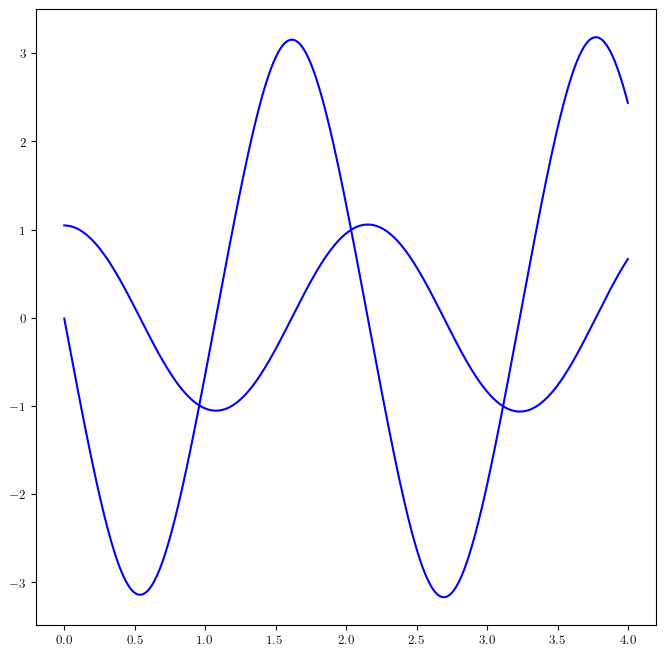

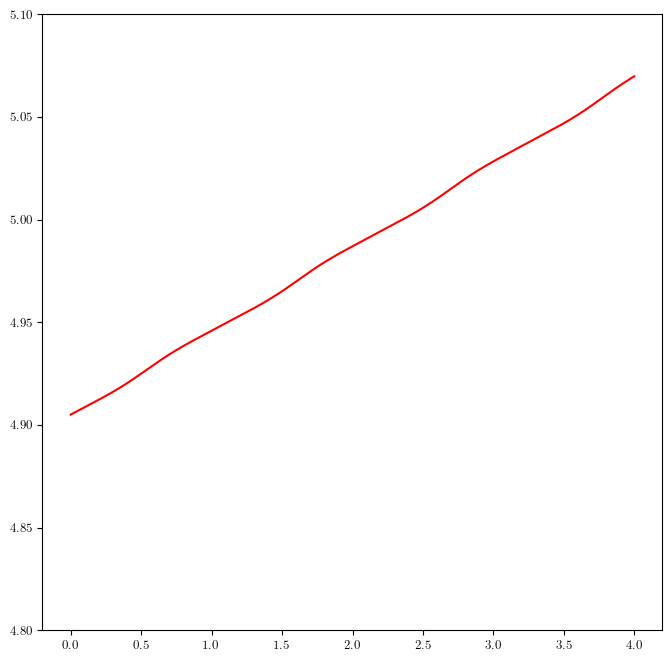

In [ ]:
# minimal code example
# Pendulum simulation
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output

# We maintain the following numpy vectors  dx = f(x,u,t,param,w) , y = h(x,param,v)

# 1. initialization - init_parameters()
m, L, g = 1, 1, 9.81   # Mass (kg), pendulum length (m), acceleration due to gravity (m.s-2).
dt = 0.001 
theta0, v0 = np.radians(60), 0 # Initial angular displacement (rad), tangential velocity (m.s-1)
t_end = 4; # 2 times period
X = []; T= []; U =[]; E=[]; # Variables for data acquisition

# these vectors are needed to define a system model
x = np.array([theta0, v0]) # state vector - variables
param = np.array([dt,m,L,g])  # the parameter vector - constants

#2 . simulation - 
for t in np.arange(0,t_end,dt):
  u = 0  # no input applied to the pendulum
  
  theta = x[0] #extract state
  omega = x[1]
  #---------------MODIFY THIS BLOCK-------------------------------------
  # TODO BY STUDENT : FIND THE ENERGY e
  e = g * (L - L * np.cos(x[0])) + 0.5 * L**2 * x[1]**2 # Energy calculation

  #TODO BY STUDENT : FIND dx
  dtheta = omega   
  domega = u/(m*L**2) - g/L*np.sin(theta)
  dx = np.array([dtheta, domega])

  #TODO BY STUDENT : INTEGRATE TO FIND NEXT x
  x = x + dx*dt # Euler integration
  #----------------END(MODIFY THIS BLOCK)----------------------------------

  #Data Aquisition
  X.append(x) 
  T.append(t)
  U.append(u)
  E.append(e)

# 4. visualization functions
fig1 = plt.figure()
p = plt.plot(T, X, color='b')
fig2 = plt.figure()
p = plt.plot(T, E, color='r')
plt.ylim(4.8, 5.1)
anim = gnc.animate_isl_pendulum(X,U,T,param,10,3) # this is a custom visualization
anim

### **Exercise 1.11**

Given below is a more structured version of the above simulation. The code now has a sperate function "*pendulum_sys_model*" which defines the system model. And there are two utility functions which implement the fowrward euler and the RK4 integrations to use as needed. The code currently implements forward euler integration. 
Generate the energy graph for the pendulum by updating the code to perform RK4 simulation. Compare and comment on the advantage of using RK4 for this particular system simulation over forward euler. 

Number of frames : 200


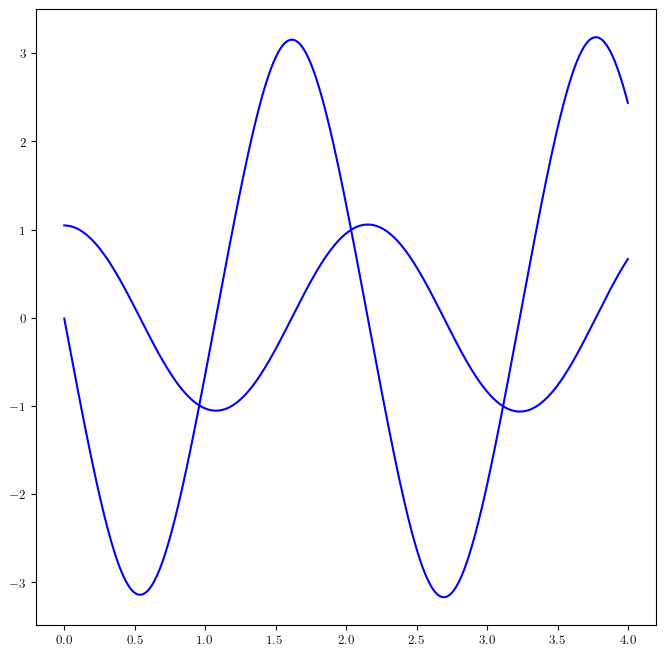

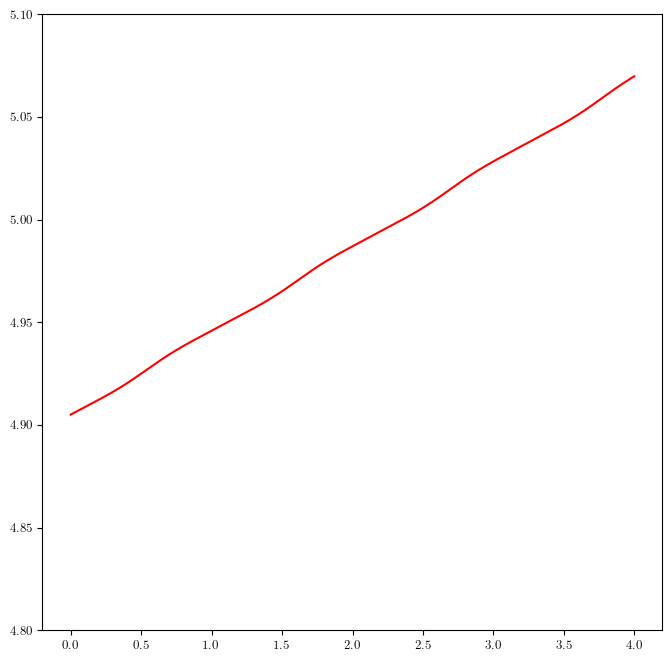

In [ ]:
# Pendulum simulation using structured code - (used for the rest of the simulations)
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import clear_output
from numpy.random import randn

# We maintain the following numpy vectors  dx = f(x,u,t,param,w) , y = h(x,param,v)

# 1. initialization - init_parameters()
m, L, g = 1, 1, 9.81   # Mass (kg), pendulum length (m), acceleration due to gravity (m.s-2).
dt = 0.001 
i = 0   # data point iterator
theta0, v0 = np.radians(60), 0 # Initial angular displacement (rad), tangential velocity (m.s-1)
t_end = 4; # 2 times period
X = []; T= []; U =[]; E=[]; # Variables for data acquisition

# these vectors are needed to define a system model
x = np.array([theta0, v0]) # state vector - variables
u = 0.0 # input variable - 0 for this emample
t = 0.0 # time variable
param = np.array([dt,m,L,g])  # the parameter vector - constants

# 2. Define the system simulation function
def pendulum_sys_model(x,u,t,param):
  dt = param[0];m = param[1];L = param[2];g = param[3]; # extract params
  
  theta = x[0] #extract state
  omega = x[1]
  
  #apply sys model
  dtheta = omega   
  domega = u/(m*L**2) - g/L*np.sin(theta)
  
  dx = np.array([dtheta, domega])
  return dx

# 3. Utility functions for integration
def int_euler(func,x,u,t,param):
  # make sure param 0 is dt
  dt = param[0]
  x = x + func(x,u,t,param)*dt  #fwd euler integration
  return x

def int_RK4(func,x,u,t,param):
  # make sure param 0 is dt
  dt = param[0]
  k1 = func(x, u, t, param)
  k2 = func(x + dt/2. * k1, u, t + dt/2., param)
  k3 = func(x + dt/2. * k2, u, t + dt/2., param)
  k4 = func(x + dt    * k3, u, t + dt, param)
  x = x + dt / 6. * (k1 + 2. * k2 + 2. * k3 + k4)
  return x

   
#4 . simulation - simulate_sys_model(), integrate(), simulate_meas_model()
for t in np.arange(0,t_end,dt):
  i = i + 1
  u = 0  # no input applied to the pendulum
  e = g * (L - L * np.cos(x[0])) + 0.5 * L**2 * x[1]**2 # Energy calculation
  x = int_euler(pendulum_sys_model,x,u,t,param)  #TODO by STUDENT -  change this to perform RK4

  #Data Aquisition
  X.append(x)
  T.append(t)
  U.append(u)
  E.append(e)

# 4. visualization functions
fig1 = plt.figure()
p = plt.plot(T, X, color='b')
fig2 = plt.figure()
p = plt.plot(T, E, color='r')
plt.ylim(4.8, 5.1)
anim = gnc.animate_isl_pendulum(X,U,T,param,10,3) # this is a custom visualization
anim

### **Exercise 1.12**

Figure below illustrates a mobile robot traversing on a 2D plance with its body frame denoted as $\{B\}$ and its inertial frame denoted as $\{I\}$. The robots state is defined by its posistion along x axis $p_x$, along y axis $p_y$ and its planar orientation $\theta$. The robot has its velocity along the body fixed forward direction $v$ and its angular velocity $\omega$ as inputs.  Find the expresion for its its system model $\mathbf{f}$ in the form:

$\dot{\boldsymbol{x}}=f(\boldsymbol{x,u})$

Using $dt=0.1 s$ as the sampling time perform a $12.6 ~second$ forward Euler simulation of the robot starting with initial codition $\theta = 0^{\circ}$, $p_x=0~m$ and $p_y=-1~m$. Take the inputs of the system to be $v=1~m/s$ and $\omega= 1 rad/s$. Generate a plot of the state vs time and the trace the trajectory of the robot on the 2D plane over the duration of the simulation. Use the given minimal code template to complete the simulation by filling the portions commented with # TODO BY STUDENT.

<center>
<div>
<img src="https://drive.google.com/uc?export=view&id=1QT4YzdXV3V0TKiHM5qxI1gY91vyq9S_y"
    width="350"/>
</div>
</center>


Number of frames : 100


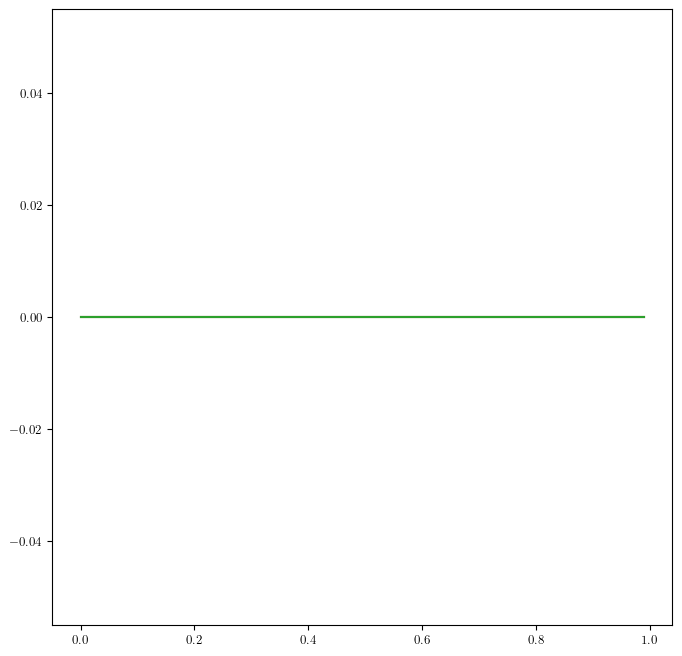

In [ ]:
# 2D robot simulation
# minimal code example
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output
from utils import wrapToPi


# We maintain the following numpy vectors  dx = f(x,u,t,param,w) , y = h(x,param,v)

# 1. initialization - init_parameters() -  #TODO by STUDENT : update initialization
dt = 0.01 
p0= np.array([0.,0.])
theta0= 0.0 # Initial angular displacement (rad) in quaternion
t_end = 1.0; # 2 times period
X = []; T= []; U =[]; E=[]; # Variables for data acquisition

# these vectors are needed to define a system model
x = np.block([p0,theta0]) # state vector - variables
param = np.array([dt])  # the parameter vector - constants

#2 . simulation - 
for t in np.arange(0,t_end,dt):
  # TODO by STUDNET: UPDATE INPUT
  u = np.array([0,0])  
  
  # TODO by STUDNET: READ CURRENT STATE X
  p = x[0:2]
  theta = x[2]
  

  # TODO by STUDNET: INTEGRATE TO FIND NEXT X
  
  x[2] = wrapToPi(x[2])

  # TODO by STUDNET: UPDATE NEXT STATE X
  
  
  #Data Aquisition
  X.append(x) 
  T.append(t)
  U.append(u)

# 4. visualization functions
fig1 = plt.figure()
p = plt.plot(T, X)

# TODO by STUDNET: Plot the trajectory of the robot (p_x vs p_y)


anim = gnc.animate_2Dbot(X,U,T,param,0.5,300,4) # this is a custom visualization
anim

# **Rotation representation - Quaternions**

* Thus far we've looked at two ways of representing rotations, i.e., rotation matrices and Euler angles. 
* In Exercise 1.6 we showed that the Euler angle parameterization can approach singularity (gimbal lock) at `pitch=90`, while Rotation matrices maintains the ability to operate without approaching numerical singularities. 
* However the number of paramters of rotation matrices is 9 which makes mathmatical programming heavily overparameterized to overcome the singularity issue. 
* Unit quaternion parameterization uses a  4 dimensional unit vector to represent rotations with the desirable property of not producing singular results at gimbal lock configurations. 
* The rotation kinematics using quaternion parameterization can be represented as below which is singularity free. 
*Quaternions still have an undesirable property termed double wrapping i.e., there are two quaternions that can represent the same unique rotation in SO3. 

* This can be avoided in practice by forcing the first element of the quaternion to be always positive. Thereby forcing a one to one mapping using unit quaternions. 


* There are other parameterizations that are commonly used in practice especially for mathematical analysis. 
* `Axis angle` parameterization represents any arbitary 3D rotation as a rotation about a 3D unit vector $\vec{\mathbf{a}}$ with an angle $\phi$.  
* `Rotationa vector` parameterization represents the axis and the angle as a single vector as follows:
\begin{equation}
\boldsymbol{\theta}=\vec{\mathbf{a}}.\phi
\end{equation}. 
* Note that both these representations (axis angle and rotation vector) wraps around at 180 degrees, hence have a discontinuity at 180. But these are important paramters to know as it will be heavily used when dealing with mathematical optimizations and analysis involving rotations in 3D.

<center>
<div>
<img src="https://drive.google.com/uc?export=view&id=1ga-wjYwaP40eWKRsZfqXD31MybKx7o8G"
    width="550"/>
</div>
</center>


### **Example 1.11**

The orientation of a body frame is having a roll of $15^{\circ}$, a pitch of $30^{\circ}$, and a yaw of $45^{\circ}$. Express this rotation as 


1.   Rotation Matrix $R$
2.   Quarternion $\boldsymbol{q}$
3.   Rotation vector $\boldsymbol{\theta}$
4.   Axis angle $(\boldsymbol{a},\phi)$

For this we use a the jaxlie package.

In [ ]:
%%capture
!pip install jaxlie

In [ ]:
import numpy as np
from jaxlie import SO3
from numpy import pi

#The rotation is expressed as an SO3 type. This allows to do all differnet representations easily
Rot = SO3.from_rpy_radians(15/180*pi,30/180*pi,45/180*pi)  #initialize from RPY
#Rot = SO3(np.array([0.89769256 0.01828305 0.28532013 0.33527035])) #initialize from quaternion
#Rot = SO3.from_matrix(np.array([[ 0.61237246, -0.59150636,  0.524519  ],
#                                [ 0.6123724,   0.7745191 ,  0.15849364],
#                                [-0.49999997,  0.22414386,  0.8365163 ]])) #initialize from mat
#Rot = SO3.exp(np.array([0.03786646, 0.59093344, 0.69438654])) #initialize from rot vector

# Rotation in 4 different forms
print("1.As Rotation Matrix :")
print(Rot.as_matrix())
print("2.As Quarternion :",np.array(Rot.parameters()))
print("3.As Rotation Vector :",Rot.log())
print("4.As Axis angle :",np.linalg.norm(Rot.log()), Rot.log()/np.linalg.norm(Rot.log()))
print("5.As Euler Angles :",np.array([Rot.compute_roll_radians(),Rot.compute_pitch_radians(),Rot.compute_yaw_radians()]))


1.As Rotation Matrix :
[[ 0.61237246 -0.59150636  0.524519  ]
 [ 0.6123724   0.7745191   0.15849364]
 [-0.49999997  0.22414386  0.8365163 ]]
2.As Quarternion : [0.89769256 0.01828305 0.28532013 0.33527035]
3.As Rotation Vector : [0.03786646 0.59093344 0.69438654]
4.As Axis angle : 0.9125836 [0.04149369 0.64753896 0.76090187]
5.As Euler Angles : [0.2617994  0.5235988  0.78539824]


In [ ]:
Rot = SO3.from_rpy_radians(0/180*pi,30/180*pi,0/180*pi)
print(Rot)
print(np.cos(30/180*pi/2))
print(np.sin(30/180*pi/2))

SO3(wxyz=[0.96593 0.      0.25882 0.     ])
0.9659258262890683
0.25881904510252074


### **Exercise 1.13**

The orientation of a body frame is having the following quarternion $q = [ 0.0 ,-1.0, 0.0 , 0.0]$. Express the rotation as following:


1.   Rotation Matrix $R$
2.   Roll pitch Yaw $(roll~,pith~,yaw)$
3.   Rotation vector $\boldsymbol{\theta}$
4.   Axis angle $(\boldsymbol{a},\phi)$

## **Rotation matrix integration**


</br></br></br></br></br></br></br>
</br></br></br></br></br></br></br>
</br></br></br></br></br></br></br>

## **Example 1.12**

Consider a rotating rigid body with its body frame denoted as $\{B\}$ and its inertial frame denoted as $\{I\}$. The robots state is defined by its 3D orientation represented by quaternion $^i\mathbf{q}_b := \mathbf{q} $. The robot has its angular velocity $^b\boldsymbol{\omega}_{ib}:=~\boldsymbol{\omega}$ as inputs.  Find the expresion for its system model $\mathbf{f}$ in the form:

$\dot{\boldsymbol{x}}=f(\boldsymbol{x,u})$

Using $dt=0.1~s$ as the sampling time perform a $60 ~second$ forward Euler simulation of the robot starting with initial codition $\mathbf{q} = [ 0.0 ,-1.0, 0.0 , 0.0]$. Take the inputs of the system to be $\boldsymbol{\omega}= [0.3,0.0,0.1] rad/s$. Generate a plot of the state vs time and generate a second plot representing the rotation vs time in Euler angles (roll, pitch, yaw). Use the given minimal code template to complete the simulation by filling the portions commented with # TODO BY STUDENT.

Number of frames : 100


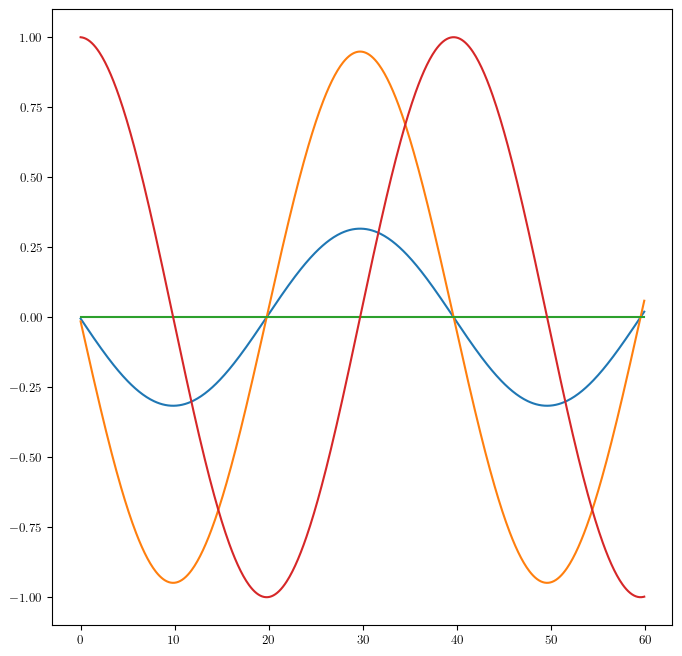

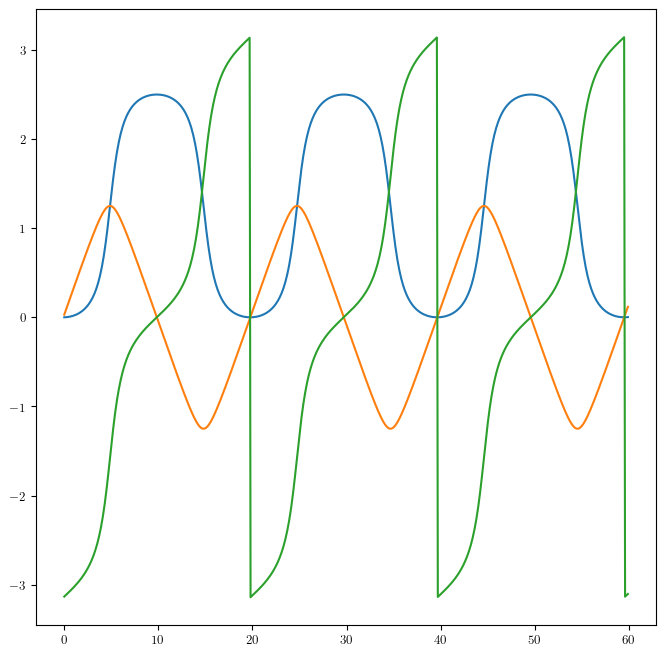

In [ ]:
# minimal code example
# Rotating body velocity input simulation
#!pip install jaxlie
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output
from jaxlie import SO3

# We maintain the following numpy vectors  dx = f(x,u,t,param,w) , y = h(x,param,v)

# 1. initialization - #TODO by student : update parameters
dt = 0.1 
q0= np.array([0.,0.,0.,1]) # Initial angular displacement (rad) in quaternion
t_end = 60; # 1 minute
X = []; T= []; U =[]; RPY=[]; # Variables for data acquisition

# these vectors are needed to define a system model
x = q0 # state vector - variables
param = np.array([dt])  # the parameter vector - constants

#2 . simulation - 
for t in np.arange(0,t_end,dt):
  u = np.array([0.0,0.3,0.1])  #TODO by student : update  input vector
  
  # TODO: READ CURRENT STATE X
  q = x
  omega = u

  # TODO:INTEGRATE TO FIND NEXT X
  R = SO3(q)  # make rotmat from quaternion (wxyz)
  R = SO3.multiply(R,SO3.exp(omega*dt)) #integration

  # UPDATE NEXT STATE X
  q = np.array(R.parameters()) #rotmat to q_wxyz
  x = q
  rpy = np.array([R.compute_roll_radians(),R.compute_pitch_radians(),R.compute_yaw_radians()])

  #Data Aquisition
  X.append(x) 
  T.append(t)
  U.append(u)
  RPY.append(rpy)
  

# 4. visualization functions
fig1 = plt.figure()
p = plt.plot(T, X)
fig2 = plt.figure()
p = plt.plot(T, RPY)


anim = gnc.animate_ahrs(X,U,T,param,100,10)
anim

## **Exercise 1.14**

Consider a rotating and translating 3D rigid body with its body frame denoted as $\{B\}$ and its inertial frame denoted as $\{I\}$. The robots state is defined by its 3D position and orientation represented by position vector $^i\mathbf{p}_b := \mathbf{p} $ and  quaternion $^i\mathbf{q}_b := \mathbf{q} $. The robot has its linear velocity $^b\boldsymbol{v}_{ib}:=~\boldsymbol{v}$ and angular velocity $^b\boldsymbol{\omega}_{ib}:=~\boldsymbol{\omega}$ as inputs. Find the expresion for its system model $\mathbf{f}$ in the form:

$\dot{\boldsymbol{x}}=f(\boldsymbol{x,u})$

Using $dt=0.1~s$ as the sampling time perform a $60 ~second$ forward Euler simulation of the robot starting with initial codition  $\mathbf{p} = [ 0.0 ,-1.0, 0.0]$, $\mathbf{q} = [ 0.0 ,-1.0, 0.0 , 0.0]$. Take the inputs of the system to be $\boldsymbol{v}= [0.3 , 0,  0 ] m/s$ and $\boldsymbol{\omega}= [0.3,0.0,0.1] rad/s$. Generate a plot of the position vs time and generate a second plot representing the rotation vs time in Euler angles (roll, pitch, yaw). Use the given minimal code template to complete the simulation by filling the portions commented with # TODO BY STUDENT.

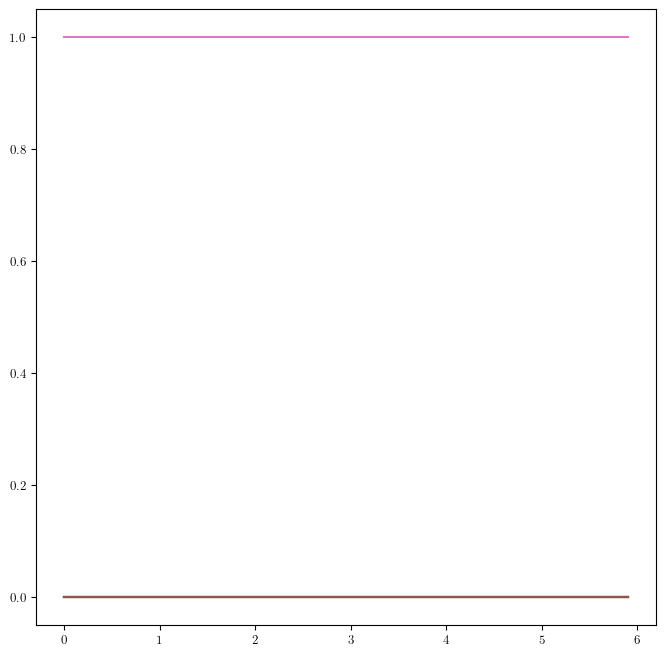

In [ ]:
# minimal code example
# 3D robot velocity input simulation
#!pip install jaxlie
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output
from jaxlie import SO3

# We maintain the following numpy vectors  dx = f(x,u,t,param,w) , y = h(x,param,v)

# 1. initialization - init_parameters()
dt = 0.1 
p0= np.array([0.,0.,0.])
q0= np.array([0.,0.,0.,1]) # Initial angular displacement (rad) in quaternion
t_end = 6; # 1 minute
X = []; T= []; U =[]; E=[]; # Variables for data acquisition

# these vectors are needed to define a system model
x = np.block([p0,q0]) # state vector - variables
param = np.array([dt])  # the parameter vector - constants

#2 . simulation - 
for t in np.arange(0,t_end,dt):
  u = np.array([1,0,0,0.1,2,0.5])  
  
  # TODO by student: READ CURRENT STATE X
  p = x[0:3]
  q = x[3:7]

  # TODO by student:INTEGRATE TO FIND NEXT X
 

  # TODO by student: UPDATE NEXT STATE X
  x =np.block([p,q])
  
  #Data Aquisition
  X.append(x) 
  T.append(t)
  U.append(u)
  #TODO by student : save roll pitch yaw

# 4. visualization functions
fig1 = plt.figure()
p = plt.plot(T, X)

#TODO by student : genearte position and roientation graphs

#anim = gnc.animate_3Dbot(X,U,T,param,300) # this is a custom visualization
#anim